In [31]:
import math
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')





## Data from Boston, MA

In [71]:
df1 = pd.read_csv('/Users/roumyadas/Downloads/rideshare_kaggle.csv')
df = df1.drop(labels=['id','timestamp','day','month','timezone','product_id',\
                    'apparentTemperature','windGustTime','temperatureHighTime','temperatureLowTime',\
                     'apparentTemperatureHigh','apparentTemperatureHighTime','apparentTemperatureLow',\
                     'apparentTemperatureLowTime','visibility.1',\
                     'temperatureMin','temperatureMaxTime','temperatureMinTime','temperatureMaxTime',\
                     'apparentTemperatureMin','apparentTemperatureMinTime',\
                     
                     'apparentTemperatureMax','apparentTemperatureMaxTime','temperatureHigh','temperatureLow',\
                     'sunriseTime','sunsetTime','uvIndexTime','temperatureMax','precipIntensityMax',\
                    'ozone','dewPoint','precipIntensity','source','destination'],axis=1)

    pandas ascii encoder does not work for this file. Continuing...
    pandas utf-8 encoder does not work for this file. Continuing...
    pandas iso-8859-1 encoder does not work for this file. Continuing...
    pandas cp1252 encoder does not work for this file. Continuing...
    pandas latin1 encoder does not work for this file. Continuing...
Not able to read or load file. Please check your inputs and try again...


In [33]:
df.head(2)

,hour,datetime,source,destination,cab_type,name,price,distance,surge_multiplier,latitude,...,humidity,windSpeed,windGust,visibility,icon,pressure,windBearing,cloudCover,uvIndex,moonPhase
0,9,2018-12-16 09:30:07,Haymarket Square,North Station,Lyft,Shared,5.0,0.44,1.0,42.2148,...,0.68,8.66,9.17,10.000,partly-cloudy-night,1021.98,57,0.72,0,0.30
1,2,2018-11-27 02:00:23,Haymarket Square,North Station,Lyft,Lux,11.0,0.44,1.0,42.2148,...,0.94,11.98,11.98,4.786,rain,1003.97,90,1.00,0,0.64


In [ ]:
df.columns

In [46]:
from datetime import datetime
df.datetime = pd.to_datetime(df.datetime)

In [47]:
type(df.datetime)

pandas.core.series.Series

In [52]:
#df['weekday'] = df.datetime.weekday()

In [83]:
df = df.dropna()

In [84]:
df_cont = df.drop(labels=['datetime','cab_type','name','price','short_summary',\
                         'long_summary','icon'], axis=1)


df_cat = df.loc[:,['cab_type','name','price','short_summary',\
                         'long_summary','icon']]

In [85]:
### VIF --> apparentTemperature,windGustTime,temperatureHighTime,temperatureLowTime,apparentTemperatureHigh,\
#apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,visibility.1,\
#temperatureMin,temperatureMaxTime,temperatureMinTime,temperatureMaxTime,apparentTemperatureMin,
#apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime,temperatureHigh,temperatureLow,\
#sunriseTime,sunsetTime,uvIndexTime,temperatureMax,precipIntensityMax


In [53]:
df.dtypes

hour                          int64
datetime             datetime64[ns]
source                       object
destination                  object
cab_type                     object
name                         object
price                       float64
distance                    float64
surge_multiplier            float64
latitude                    float64
longitude                   float64
temperature                 float64
short_summary                object
long_summary                 object
precipProbability           float64
humidity                    float64
windSpeed                   float64
windGust                    float64
visibility                  float64
icon                         object
pressure                    float64
windBearing                   int64
cloudCover                  float64
uvIndex                       int64
moonPhase                   float64
dtype: object

In [75]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(df):
    vif = pd.DataFrame()
    vif["variables"] = df.columns
    vif["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return(vif)

calc_vif(df_cont)
#calc_vif(df_cat)

,variables,VIF
0,hour,5.073414e+00
1,distance,4.698690e+00
2,surge_multiplier,1.234824e+02
3,latitude,1.162950e+06
4,longitude,1.207448e+06
5,temperature,6.163997e+01
6,precipProbability,4.345028e+00
7,humidity,9.092444e+01
8,windSpeed,6.267265e+01
9,windGust,3.938457e+01


### VIF --> apparentTemperature,windGustTime,temperatureHighTime,temperatureLowTime,apparentTemperatureHigh,apparentTemperatureHighTime,apparentTemperatureLow,apparentTemperatureLowTime,visibility.1,temperatureMin,temperatureMaxTime,temperatureMinTime,temperatureMaxTime,apparentTemperatureMin,apparentTemperatureMinTime,apparentTemperatureMax,apparentTemperatureMaxTime,temperatureHigh,temperatureLow,sunriseTime,sunsetTime,uvIndexTime,temperatureMax,precipIntensityMax

In [ ]:
#pd.crosstab(index=df.distance,columns=[df.source,df.destination])
len(df.longitude.unique()),len(df.latitude.unique()) , len(df.short_summary.unique())

In [ ]:
sum(df.duplicated())

In [ ]:
dat = pd.DataFrame()
dat['source'] = df.source
dat['destination'] = df.destination
dat['distance'] = df.distance
len(dat)-sum(dat.duplicated())

In [ ]:
df.short_summary.unique(),df.long_summary.unique()

In [ ]:
df.info()

In [3]:
pip install autoviz --upgrade

     |████████████████████████████████| 64 kB 1.5 MB/s eta 0:00:01


  Attempting uninstall: autoviz
    Found existing installation: autoviz 0.1.43
    Uninstalling autoviz-0.1.43:
      Successfully uninstalled autoviz-0.1.43
Note: you may need to restart the kernel to use updated packages.


    max_rows_analyzed is smaller than dataset shape 693071...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 18)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
distance,471,float64,0,0.000000,4.710000,0,
pressure,315,float64,0,0.000000,3.150000,0,
dewPoint,312,float64,0,0.000000,3.120000,0,
temperature,308,float64,0,0.000000,3.080000,0,
windSpeed,290,float64,0,0.000000,2.900000,0,
windGust,285,float64,0,0.000000,2.850000,0,skewed: cap or drop outliers
visibility,226,float64,0,0.000000,2.260000,0,skewed: cap or drop outliers
windBearing,195,int64,0,0.000000,1.950000,0,
cloudCover,83,float64,0,0.000000,0.830000,0,
precipIntensity,63,float64,0,0.000000,0.630000,0,skewed: cap or drop outliers


    18 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...
Number of All Scatter Plots = 120


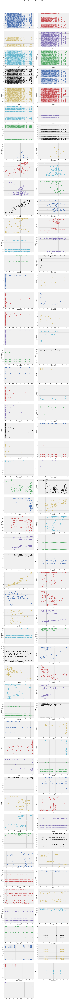

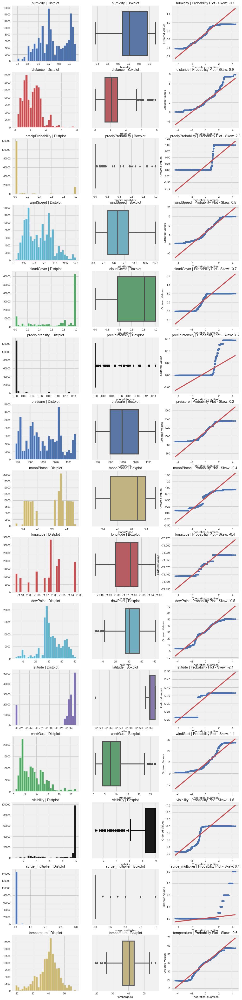

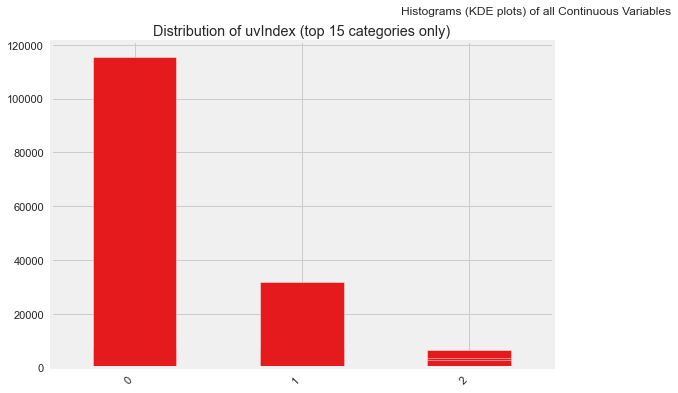

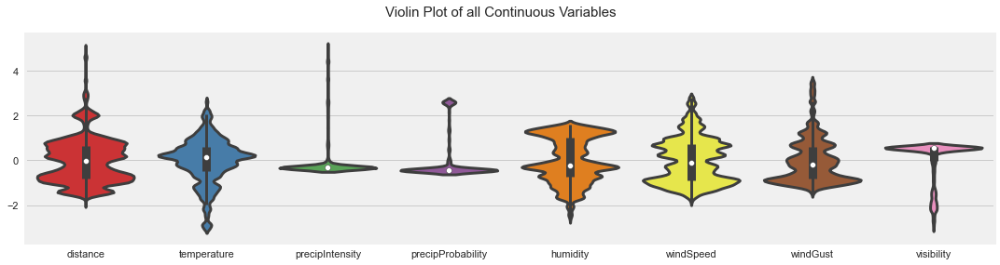

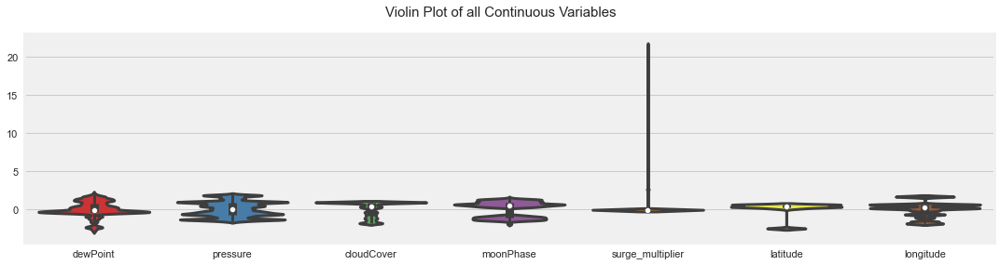

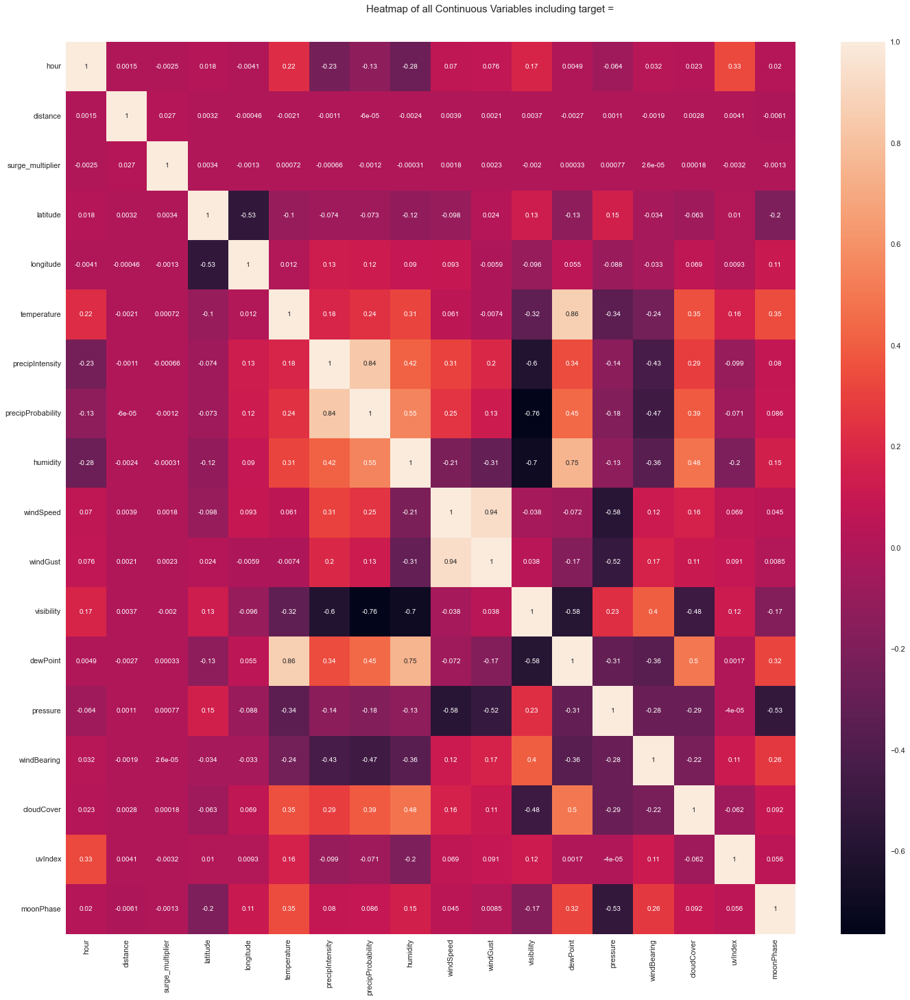

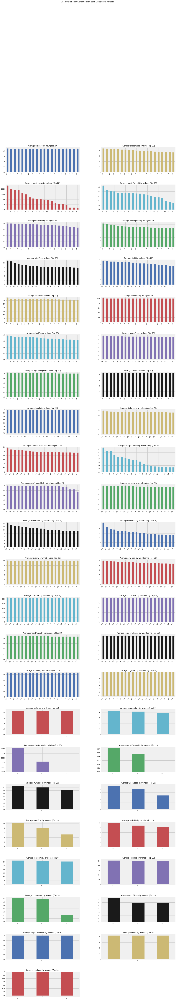

All Plots done
Time to run AutoViz = 32 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [2]:
%matplotlib inline
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df_av = AV.AutoViz('/Users/roumyadas/Desktop/Data/new_rideshare.csv')

In [ ]:
?pd.crosstab

In [ ]:

df_cont.to_csv('/Users/roumyadas/Desktop/new_rideshare.csv',index=False)

    max_rows_analyzed is smaller than dataset shape 693071...
        randomly sampled 150000 rows from read CSV file
Shape of your Data Set loaded: (150000, 18)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
distance,471,float64,0,0.000000,4.710000,0,
pressure,315,float64,0,0.000000,3.150000,0,
dewPoint,312,float64,0,0.000000,3.120000,0,
temperature,308,float64,0,0.000000,3.080000,0,
windSpeed,290,float64,0,0.000000,2.900000,0,
windGust,285,float64,0,0.000000,2.850000,0,skewed: cap or drop outliers
visibility,226,float64,0,0.000000,2.260000,0,skewed: cap or drop outliers
windBearing,195,int64,0,0.000000,1.950000,0,
cloudCover,83,float64,0,0.000000,0.830000,0,
precipIntensity,63,float64,0,0.000000,0.630000,0,skewed: cap or drop outliers


    18 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 150000 exceeds maximum, randomly sampling 150000 rows for EDA...
Number of All Scatter Plots = 120


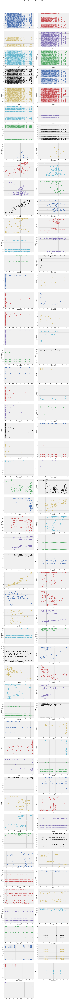

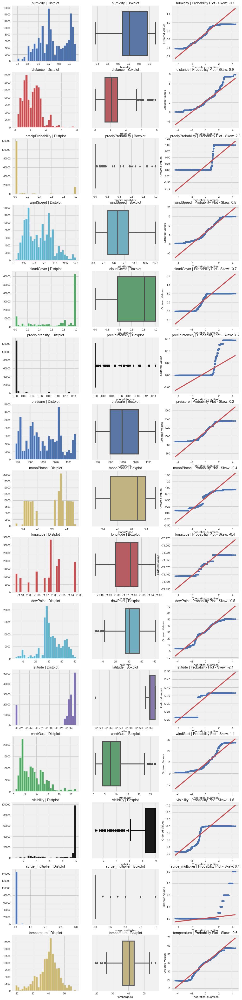

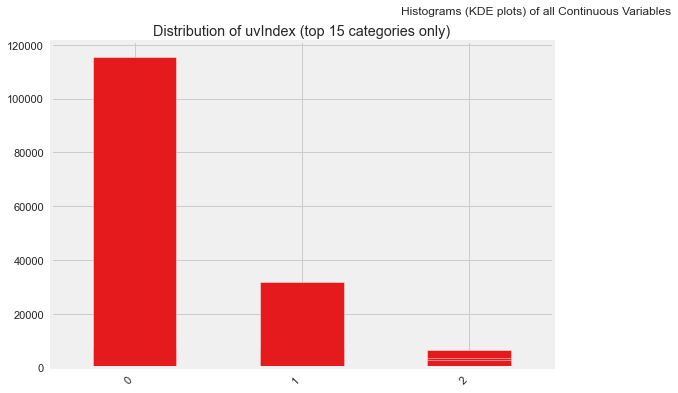

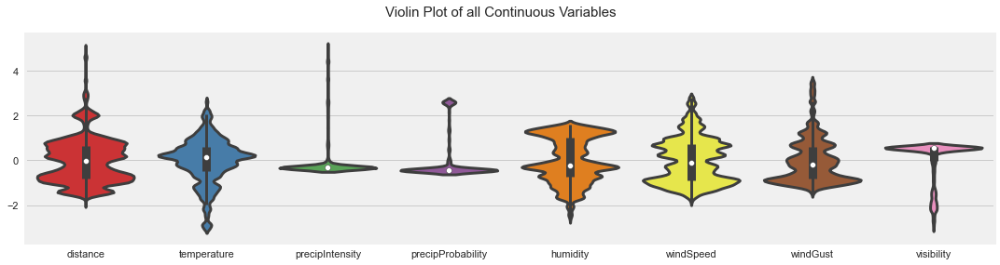

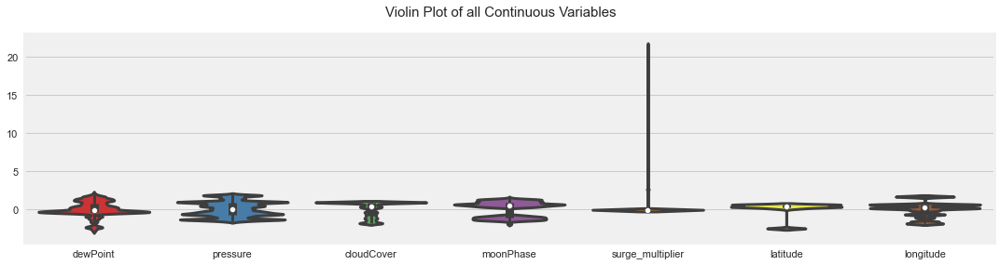

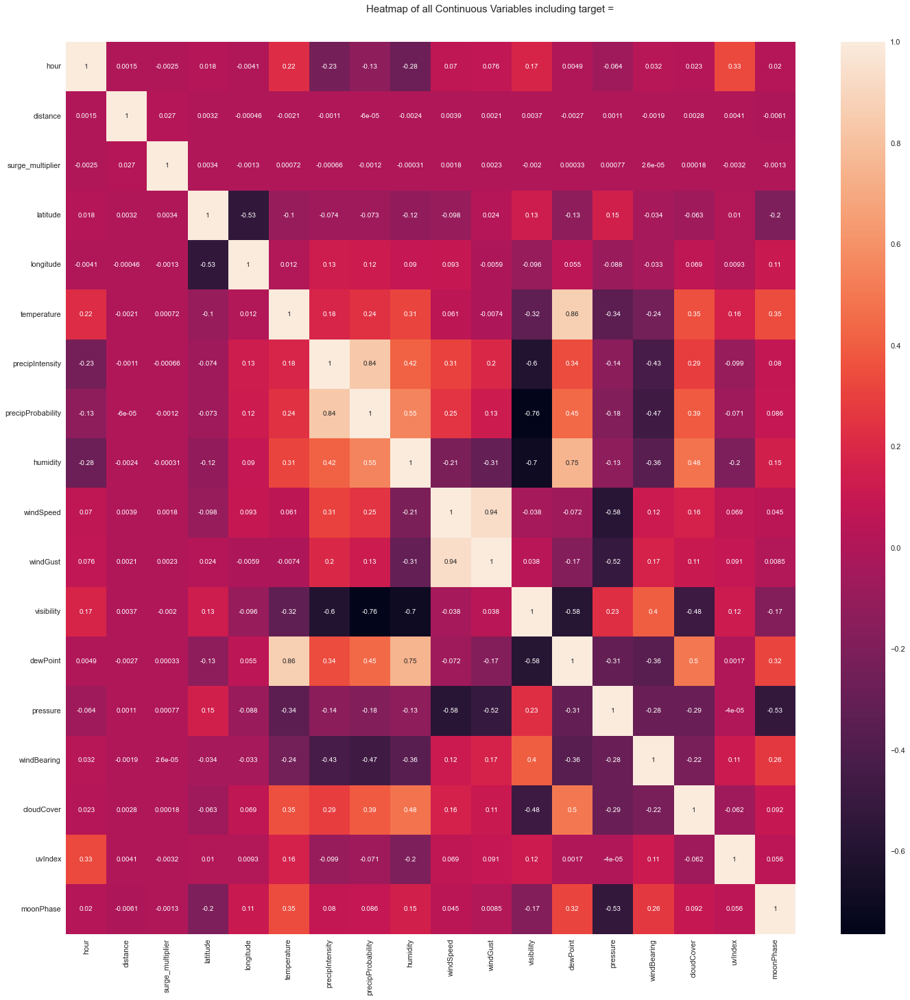

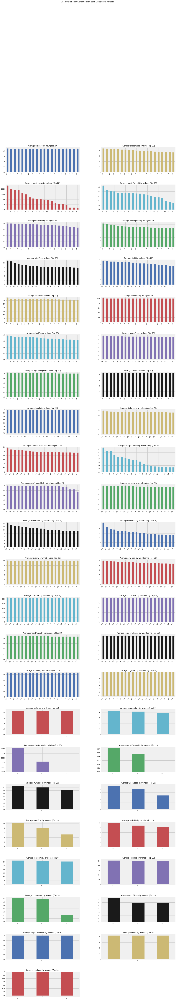

All Plots done
Time to run AutoViz = 31 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [5]:
%matplotlib inline
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df_av = AV.AutoViz('/Users/roumyadas/Desktop/Data/new_rideshare.csv')


In [ ]:
df_cont.head()

In [86]:
from sklearn.preprocessing import LabelEncoder, QuantileTransformer, MinMaxScaler, StandardScaler, MaxAbsScaler

#df_cat = pd.DataFrame(df_cat.apply(LabelEncoder().fit_transform))


scaler = MaxAbsScaler()
 
scaler.fit(df_cont)
scaled_features = scaler.transform(df_cont)
df_cont = pd.DataFrame(scaled_features, columns=df_cont.columns)

In [16]:
df_cont.head(2)

,hour,distance,surge_multiplier,latitude,longitude,temperature,precipProbability,humidity,windSpeed,windGust,visibility,pressure,windBearing,cloudCover,uvIndex,moonPhase
0,0.391304,0.05598,0.333333,0.996429,-0.998982,0.739951,0.0,0.708333,0.577333,0.336514,1.0000,0.986896,0.160112,0.72,0.0,0.322581
1,0.086957,0.05598,0.333333,0.996429,-0.998982,0.761622,1.0,0.979167,0.798667,0.439633,0.4786,0.969504,0.252809,1.00,0.0,0.688172


In [87]:
df_cat = pd.get_dummies(df_cat, columns = df_cat.columns)
#print(df_cat)



In [61]:
data.price.isna()

0         False
1         False
2         False
3         False
4         False
          ...  
637971    False
637972    False
637973    False
637974    False
637975    False
Name: price, Length: 587333, dtype: bool

In [88]:
data = pd.merge(df_cont,df_cat,left_index=True, right_index=True).merge(df.price,left_index=True, right_index=True)
data1=df1

In [8]:
data.head(2)

,hour,distance,surge_multiplier,latitude,longitude,temperature,precipProbability,humidity,windSpeed,windGust,...,long_summary_ Rain throughout the day.,"long_summary_ Rain until morning, starting again in the evening.",icon_ clear-day,icon_ clear-night,icon_ cloudy,icon_ fog,icon_ partly-cloudy-day,icon_ partly-cloudy-night,icon_ rain,price
0,0.391304,0.05598,0.333333,0.996429,-0.998982,0.739951,0.0,0.708333,0.577333,0.336514,...,1,0,0,0,0,0,0,1,0,5.0
1,0.086957,0.05598,0.333333,0.996429,-0.998982,0.761622,1.0,0.979167,0.798667,0.439633,...,0,1,0,0,0,0,0,0,1,11.0


In [89]:
x = data.drop(labels=['price'],axis=1)
y = data.price


from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x,y, test_size = 0.25, random_state = 34)

In [ ]:
#X_train.head(10)

In [91]:
import sklearn.metrics as metrics
def regression_results(y_true, y_pred):

    # Regression metrics
    explained_variance=metrics.explained_variance_score(y_true, y_pred)
    mean_absolute_error=metrics.mean_absolute_error(y_true, y_pred) 
    mse=metrics.mean_squared_error(y_true, y_pred) 
    #mean_squared_log_error=metrics.mean_squared_log_error(y_true, y_pred)
    median_absolute_error=metrics.median_absolute_error(y_true, y_pred)
    r2=metrics.r2_score(y_true, y_pred)

    print('explained_variance: ', round(explained_variance,4))    
    #print('mean_squared_log_error: ', round(mean_squared_log_error,4))
    print('r2: ', round(r2,4))
    print('MAE: ', round(mean_absolute_error,4))
    print('MSE: ', round(mse,4))
    print('RMSE: ', round(np.sqrt(mse),4))

In [81]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, SGDRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

In [65]:
y_train

201953    10.0
114154    11.5
528060    27.5
552787     7.0
149429    20.5
          ... 
41704     18.5
374010     7.0
216950    26.0
166642     8.5
331866    11.0
Name: price, Length: 440499, dtype: float64

In [92]:
lr = LinearRegression().fit(X_train,y_train)


y_pred = lr.predict(X_test)
y_pred2 = lr.predict(X_train)

#print(lr.score(X_test,y_test)), print(lr.score(X_train,y_train))
regression_results(y_test,y_pred), regression_results(y_train,y_pred2)

explained_variance:  0.9978
r2:  0.9978
MAE:  0.0027
MSE:  0.1923
RMSE:  0.4386
explained_variance:  1.0
r2:  1.0
MAE:  0.0
MSE:  0.0
RMSE:  0.0


(None, None)

In [98]:
lr1 = Ridge().fit(X_train,y_train)


y_pred = lr1.predict(X_test)
y_pred2 = lr1.predict(X_train)

#print(lr.score(X_test,y_test)), print(lr.score(X_train,y_train))
regression_results(y_test,y_pred), regression_results(y_train,y_pred2)

explained_variance:  0.9993
r2:  0.9993
MAE:  0.0135
MSE:  0.0594
RMSE:  0.2437
explained_variance:  0.9998
r2:  0.9998
MAE:  0.0124
MSE:  0.0157
RMSE:  0.1253


(None, None)

In [21]:
def clean_dataset(df):
    assert isinstance(df, pd.DataFrame), "df needs to be a pd.DataFrame"
    df.dropna(inplace=True)
    indices_to_keep = ~df.isin([np.nan, np.inf, -np.inf]).any(1)
    return df[indices_to_keep].astype(np.float64)

In [93]:
(np.any(np.isnan(y_train))),np.all(np.isfinite(y_train))

(False, True)

In [27]:
y_train = y_train.dropna()

In [28]:
len(y_train)

478348

In [94]:
nb = GaussianNB().fit(X_train,y_train)


y_pred = nb.predict(X_test)
y_pred2 = nb.predict(X_train)

#print(nb.score(X_test,y_test)), print(nb.score(X_train,y_train))
regression_results(y_test,y_pred)

ValueError: Unknown label type: (array([ 2.5 ,  3.  ,  3.5 ,  4.5 ,  5.  ,  5.5 ,  6.  ,  6.5 ,  7.  ,
        7.5 ,  8.  ,  8.35,  8.5 ,  9.  ,  9.35,  9.5 , 10.  , 10.5 ,
       10.6 , 11.  , 11.5 , 12.  , 12.5 , 13.  , 13.5 , 14.  , 14.5 ,
       15.  , 15.5 , 16.  , 16.5 , 17.  , 17.5 , 18.  , 18.35, 18.5 ,
       19.  , 19.5 , 20.  , 20.5 , 21.  , 21.5 , 22.  , 22.5 , 23.  ,
       23.5 , 24.  , 24.5 , 25.  , 25.5 , 26.  , 26.5 , 27.  , 27.5 ,
       28.  , 28.35, 28.5 , 29.  , 29.5 , 30.  , 30.5 , 31.  , 31.5 ,
       32.  , 32.5 , 33.  , 33.5 , 34.  , 34.5 , 35.  , 35.5 , 36.  ,
       36.5 , 37.  , 37.5 , 37.85, 38.  , 38.5 , 39.  , 39.5 , 40.  ,
       40.5 , 41.  , 41.5 , 42.  , 42.5 , 43.  , 43.5 , 44.  , 44.5 ,
       45.  , 45.35, 45.5 , 46.  , 46.5 , 47.  , 47.5 , 48.  , 48.5 ,
       49.  , 49.5 , 50.5 , 51.  , 51.5 , 52.  , 52.5 , 53.  , 53.5 ,
       54.  , 54.5 , 55.  , 55.5 , 56.  , 56.5 , 57.  , 57.5 , 58.  ,
       58.5 , 59.  , 59.5 , 60.5 , 61.5 , 62.  , 62.5 , 64.  , 64.5 ,
       65.  , 67.5 , 68.5 , 73.5 , 75.  , 76.  , 80.  , 80.5 , 87.  ,
       87.5 , 89.  , 89.5 , 92.  , 97.5 ]),)

In [101]:
sgd = SGDRegressor().fit(X_train,y_train)


y_pred = sgd.predict(X_test)
y_pred2 = sgd.predict(X_train)

#print(sgd.score(X_test,y_test)), print(sg.score(X_train,y_train))
regression_results(y_test,y_pred)

explained_variance:  0.9893
r2:  0.9893
MAE:  0.3315
MSE:  0.9279
RMSE:  0.9633


In [69]:
gb = GradientBoostingRegressor().fit(X_train,y_train)


y_pred = gb.predict(X_test)
y_pred2 = gb.predict(X_train)

#print(lr.score(X_test,y_test)), print(lr.score(X_train,y_train))
regression_results(y_test,y_pred)

explained_variance:  0.8941
mean_squared_log_error:  0.0277
r2:  0.8941
MAE:  2.0157
MSE:  9.1801
RMSE:  3.0299


In [ ]:
gb.score(X_train,y_train),gb.score(X_test,y_test)

In [ ]:
knn = KNeighborsRegressor(n_neighbors=1).fit(X_train,y_train)

y_pred = knn.predict(X_test)
y_pred2 = knn.predict(X_train)

print(knn.score(X_test,y_test)), print(knn.score(X_train,y_train))

In [ ]:


rf = RandomForestRegressor().fit(X_train,y_train)

y_pred = rf.predict(X_test)
y_pred2 = rf.predict(X_train)

print(rf.score(X_test,y_test)), print(rf.score(X_train,y_train))

In [99]:
preds = pd.DataFrame()
preds['true'] = y_test
preds['prediction'] = y_pred

In [100]:
preds

,true,prediction
443182,16.5,16.490478
242946,22.5,22.511857
210748,7.0,7.007562
397204,9.5,9.502156
156644,13.5,13.475435
...,...,...
553379,16.5,16.490954
377174,7.0,6.995043
605379,27.0,27.014717
612072,11.5,11.498077
